<a href="https://colab.research.google.com/github/project-ccap/project-ccap.github.io/blob/master/2025notebooks/2024_0913cnps2024_v2s.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CCAP Project TLPA and SALA combined

- title: 転移学習による TLPA + SALA 画像認識 for 2024cnps大門プレゼンテーション用
- author: 浅川伸一
- filename: `2024_0813tlpa_sala_cnps2024.ipynb` のコピー
- last date: 2020-0713
- note:
    - 使用モデル: ResNet50, 論文: https://arxiv.org/abs/1512.03385
    - データ: TLPA 図版 大門正太郎 先生より
    - このファイルは 2025_0609 に ccap 勉強会で紹介したものである。
    
## 手順

1. データを定義する。PyTorch の場合 dataloader を使うために DataSet の定義を必要とする
2. モデルを定義する。転移学習の場合，訓練済モデルが公開されているので，そのモデルを使う。
    どのモデルを使ってもよいのだが，`model = models.vgg16(weights="DEFAULT", progress=True)` のようなモデルを使う
3. 最終層を，解くべき問題のクラス数に合わせて付け替える
4. 損失関数を定義する
5. 最適化関数を定義する
6. 訓練を実行する
7. 評価する

という流れになる

## 事前準備

In [ ]:
# Google Colab 上で実行しているかどうかを判定
import IPython
isColab = 'google.colab' in str(IPython.get_ipython())

if isColab:
    !pip uninstall numpy thinc spacy --yes
    !pip install --upgrade numpy==1.26.4 --force-reinstall
    !pip install --upgrade gensim==4.3.3



In [ ]:
%config InlineBackend.figure_format = 'retina'
import torch
#device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device = 'cuda' if torch.cuda.is_available() else 'mps' if torch.backends.mps.is_available() else 'cpu'
print(f'device:{device}')

from IPython import get_ipython
isColab =  'google.colab' in str(get_ipython())

import os
HOME = os.environ['HOME']

import sys
import numpy as np
from collections import OrderedDict
import pandas as pd
import PIL

import torchvision
from torchvision import models, transforms
import torch.utils.data as data
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


if isColab:
    !nvidia-smi -L # GPU 情報を表示

    # `import bit` する前に termcolor を downgrade しないと colab ではテキストに色がつかない\
    !pip install --upgrade termcolor==1.1
    import termcolor

    # # 日本語 transformer をインストールするためには，以下のインストールが必要
    # !pip install --upgrade xlrd
    # !pip install --upgrade 'fugashi[ipadic]'

    !python -m unidic download
    !pip install --upgrade ipadic

    # !pip install --upgrade transformers
    !pip install --upgrade jaconv

    #!git clone https://github.com/ShinAsakawa/RAM.git

try:
    import ipynbname
except ImportError:
    !pip install ipynbname
    import ipynbname

from termcolor import colored

try:
    import japanize_matplotlib
except ImportError:
    !pip install japanize_matplotlib
    import japanize_matplotlib

from tqdm.notebook import tqdm

color = 'green'
TORCH_VERSION = torch.__version__
print('torch.__version__:',colored(f'{TORCH_VERSION}', color=color, attrs=['bold']))

import sys
import numpy as np
import json
import random
from PIL import Image as PILImage
import matplotlib.pyplot as plt

try:
    import skimage.color  # for gray2rgb()
except ImportError:
    !pip install scikit-image --upgrade
    import skimage.color  # for gray2rgb()

from scipy.special import logsumexp, softmax
import importlib  # for debugging
from termcolor import colored

try:
    import ipynb_path
except ImportError:
    !pip install ipynb-path
    import ipynb_path

HOME = os.environ['HOME']
__file__ = os.path.basename(ipynb_path.get())
print(f'__file__:{__file__}')
print(f'torch.__version__:{torch.__version__}')
print(f'HOME:{HOME}')

# 乱数のシードを設定
import time
import random

torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

In [2]:
import math
import time

def asMinutes(s):
    """時間変数を見やすいように，分と秒に変換して返す"""
    m = math.floor(s / 60)
    s -= m * 60
    return f'{int(m):2d}分 {int(s):2d}秒'
    return '%dm %ds' % (m, s)

def timeSince(since, percent):
    """開始時刻 since と，現在の処理が全処理中に示す割合 percent を与えて，経過時間と残り時間を計算して表示する"""
    now = time.time()  #現在時刻を取得
    s = now - since    # 開始時刻から現在までの経過時間を計算
    #s = since - now
    es = s / (percent) # 経過時間を現在までの処理割合で割って終了予想時間を計算
    rs = es - s        # 終了予想時刻から経過した時間を引いて残り時間を計算
    return f'経過時間:{asMinutes(s)} (残り時間 {asMinutes(rs)})'

## Word2vec の読み込み

In [19]:
#import googledrivedownloader as gdd
#!rm -rf ccap

In [ ]:
if isColab:
    !pip install googledrivedownloader
    !git clone https://github.com/project-ccap/ccap.git

from ccap import ccap_w2v
w2v = ccap_w2v(is2017=False).w2v
print(f'w2v.vector_size:{w2v.vector_size}')
print(f'len(w2v.index_to_key):{len(w2v.index_to_key)}')

w2v_2017 = ccap_w2v(is2017=True).w2v
print(f'w2v_2017.vector_size:{w2v_2017.vector_size}')
print(f'len(w2v_2017.index_to_key):{len(w2v_2017.index_to_key)}')

## 学習済モデル CNN の読み込み

In [ ]:
# 各モデルを定義し，訓練済み結合係数をダウンロードする
import copy

DNNs = {}
#DNNs['resnet18'] = models.resnet18(weights="DEFAULT", progress=True)
DNNs['resnet50'] = models.resnet50(weights="DEFAULT", progress=True)
# DNNs['alexnet'] = models.alexnet(weights="DEFAULT", progress=True)
# DNNs['vgg16'] = models.vgg16(weights="DEFAULT", progress=True)
# DNNs['squeezenet']= models.squeezenet1_0(weights="DEFAULT", progress=True)
# DNNs['densenet'] = models.densenet161(weights="DEFAULT", progress=True)
# DNNs['inception'] = models.inception_v3(weights="DEFAULT", progress=True)
# DNNs['googlenet'] = models.googlenet(weights="DEFAULT", progress=True)
# DNNs['shufflenet'] = models.shufflenet_v2_x1_0(weights="DEFAULT", progress=True)
# DNNs['mobilenet'] = models.mobilenet_v2(weights="DEFAULT", progress=True)
# DNNs['resnext50_32x4d'] = models.resnext50_32x4d(weights="DEFAULT", progress=True)
# DNNs['wide_resnet50_2'] = models.wide_resnet50_2(weights="DEFAULT", progress=True)
# DNNs['mnasnet'] = models.mnasnet1_0(weights="DEFAULT", progress=True)

# 上の中から試したいモデルを選んでください。最後のモデルが有効になります。
net = DNNs['resnet50']
#net = DNNs['resnet18']
#net = DNNs['squeezenet']
#net = DNNs['googlenet']
#net = DNNs['shufflenet']
#net = DNNs['mobilenet']
#net = DNNs['vgg16']
#net = DNNs['alexnet']

V2S = copy.deepcopy(net)
V2S.fc = nn.Linear(in_features=V2S.fc.in_features, out_features=w2v.vector_size)

## 転移学習のための学習層をセット
## 転移学習で学習させるパラメータを、変数params_to_updateに格納する
params_to_update = []

# 学習させるパラメータ名
update_param_names = ["fc.weight", "fc.bias"]
update_param_names = ['layer4.0.conv1.weight', 'layer4.0.bn1.weight',
                      'layer4.0.bn1.bias', 'layer4.0.conv2.weight',
                      'layer4.0.bn2.weight', 'layer4.0.bn2.bias',
                      'layer4.0.conv3.weight', 'layer4.0.bn3.weight',
                      'layer4.0.bn3.bias', 'layer4.0.downsample.0.weight',
                      'layer4.0.downsample.1.weight', 'layer4.0.downsample.1.bias',
                      'layer4.1.conv1.weight', 'layer4.1.bn1.weight',
                      'layer4.1.bn1.bias', 'layer4.1.conv2.weight',
                      'layer4.1.bn2.weight', 'layer4.1.bn2.bias',
                      'layer4.1.conv3.weight', 'layer4.1.bn3.weight',
                      'layer4.1.bn3.bias', 'layer4.2.conv1.weight',
                      'layer4.2.bn1.weight', 'layer4.2.bn1.bias',
                      'layer4.2.conv2.weight', 'layer4.2.bn2.weight',
                      'layer4.2.bn2.bias', 'layer4.2.conv3.weight',
                      'layer4.2.bn3.weight', 'layer4.2.bn3.bias',
                      'fc.weight', 'fc.bias']

# 学習させるパラメータ以外は勾配計算をなくし、変化しないように設定
for name, param in V2S.named_parameters():
    if name in update_param_names:
        param.requires_grad = True
        params_to_update.append(param)
        #print(name)
    else:
        param.requires_grad = False


print(V2S.layer4)
print(V2S.avgpool)
print(V2S.fc)

# Dataset の読み込み

## 刺激図版の表示

In [ ]:
verbose = False  # Ture であれば刺激図版を表示する
verbose = True  # Ture であれば刺激図版を表示する

if isColab:
    import nltk
    nltk.download('wordnet')

    try:
        nltk.data.find('corpora/omw-1.4')
    except LookupError:
        nltk.download('omw-1.4')


if verbose:
    from ccap import tlpaDataset
    from ccap import salaDataset

    tlpa_ds = tlpaDataset()
    sala_ds = salaDataset()

    tlpa_ds.show_all_images()
    sala_ds.show_all_images()

## TLPA と SALA のデータ結合

全データ all_data にたいして以下の辞書を定義:

In [ ]:
%reload_ext autoreload
%autoreload 2
#from tlpa_sala import tlpa_sala_torch_Dataset
from tlpa_sala import tlpa_sala_w2v_torch_Dataset
from tlpa_sala import MLP_s2l

verbose = False
S_train_ds = tlpa_sala_w2v_torch_Dataset(phase='train', w2v=w2v, verbose=verbose)
S_val_ds = tlpa_sala_w2v_torch_Dataset(phase='val', w2v=w2v, verbose=verbose)

# DataLoaderを作成
batch_size=64
S_train_dl = torch.utils.data.DataLoader(S_train_ds, batch_size=batch_size, shuffle=True)
S_val_dl = torch.utils.data.DataLoader(S_val_ds, batch_size=batch_size, shuffle=False)


[nltk_data] Downloading package wordnet to /Users/asakawa/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw to /Users/asakawa/nltk_data...
[nltk_data]   Package omw is already up-to-date!


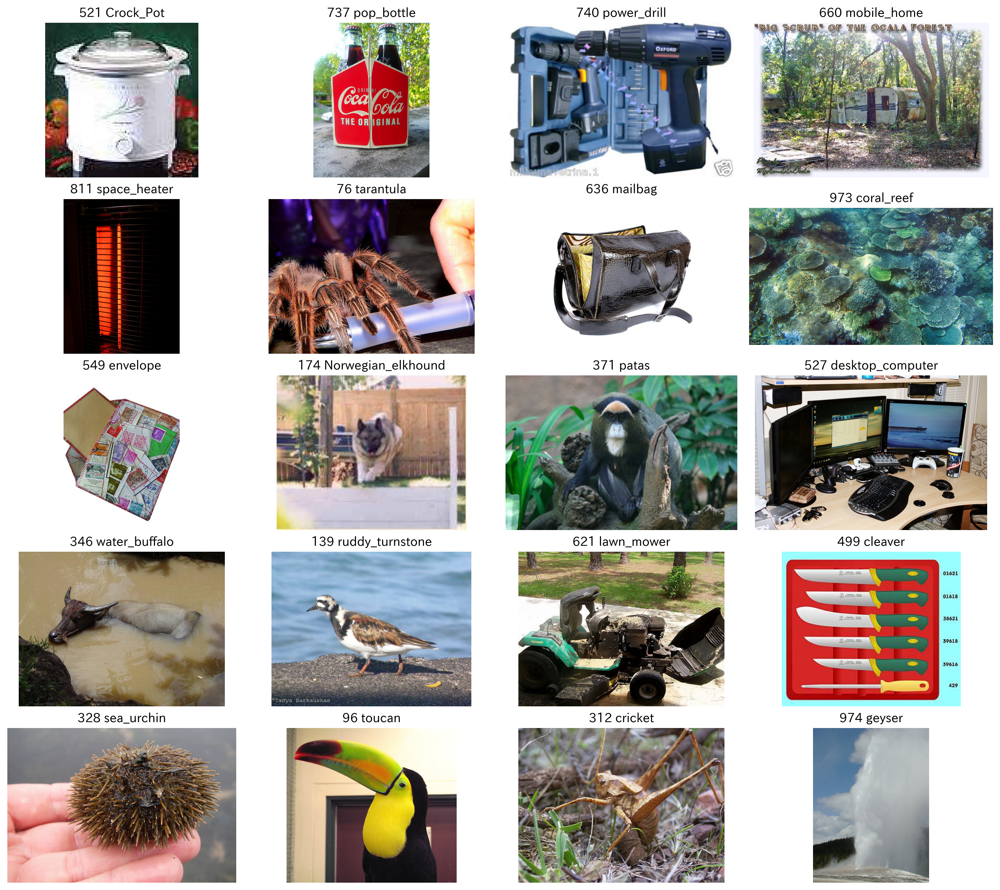

In [ ]:
import matplotlib.pyplot as plt
import PIL
import nltk  #  ImageNet の各ラベルの WordNet ID 処理用
nltk.download('wordnet')
if isColab:
    nltk.download('omw-1.4')
else:
    nltk.download('omw')

# 以下は動作確認，ImageNet の利用
# ただし本来 ImageNet の画像利用には登録が必要である
# そのため，利用時には各ユーザの責任において ImageNet への登録申請を行うこと
# 参照 URL: http://image-net.org/download-images
# 文献: J. Deng, W. Dong, R. Socher, L.-J. Li, K. Li and L. Fei-Fei, ImageNet: A Large-Scale Hierarchical Image Database,
#       IEEE Computer Vision and Pattern Recognition (CVPR), 2009.
from ccap import imagenetDataset
imagenet = imagenetDataset()
# img_no = int(input('0から999までの数字を入力して下さい'))
# imagenet.sample_and_show(img_no)

nrows, ncols = 5, 4
fig, fig_axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols * 3.4, nrows * 2.4), constrained_layout=True)
#fig, fig_axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols * 1.4, nrows * 1.4), constrained_layout=True)
# constrained_layout は subplot や 凡例やカラーバーなどの装飾を自動的に調整して，
# ユーザが要求する論理的なレイアウトをできるだけ維持しながら， 図ウィンドウに収まるようにします。

Ns = np.random.permutation(1000)
for i in range(nrows):
    for j in range(ncols):
        _x = i * 10 + j
        x = int(Ns[_x])
        img = PIL.Image.open(imagenet.sample_image(x)).convert('RGB')
        #print(x, np.array(img).shape, imagenet.data[x]['label'][0])
        fig_axes[i][j].imshow(img)
        fig_axes[i][j].axis('off')
        fig_axes[i][j].set_title(f'{x} {imagenet.data[x]["label"][0]}')

# 画像-to-意味 (V2S) への転移学習

## 学習

In [ ]:
# モデルを学習させる関数
def train_sem_model(net:torch.nn.Module=None,
                    dataloaders_dict:dict=None,
                    criterion:torch.nn.modules.loss=None,
                    optimizer:torch.optim=None,
                    lr:float=0.001,
                    w2v=w2v,
                    topn:int=5,
                    num_epochs:int=0,
                    debug:bool=False
                   ):

    start_time = time.time()

    if criterion == None:
        criterion = nn.MSELoss()

    if optimizer == None:
        optimizer = optim.Adam(params=net.parameters(), lr=0.01)

    n_data = 0
    for phase in ['train','val']:
        n_data += dataloaders_dict[phase].dataset.__len__()

    # epochのループ
    for epoch in range(num_epochs):
        print(f'エポック {epoch+1}/{num_epochs}', end="\t")

        # epochごとの学習と検証のループ
        for phase in ['train', 'val']:
            if phase == 'train':
                net.train()  # モデルを訓練モード
            else:
                net.eval()   # モデルを検証モード

            epoch_loss = 0.0  # epochの損失和
            epoch_corrects = 0  # epochの正解数

            preds = []
            for imgs, embs, tlpa_ids, wrds, ds_ids, w2v_ids in dataloaders_dict[phase]:
                optimizer.zero_grad() # optimizerを初期化

                # 順伝搬（forward）計算
                with torch.set_grad_enabled(phase == 'train'):
                    outs = net(imgs)
                    loss = criterion(outs, embs)  # 損失を計算

                    for out, wrd, label_idx in zip(outs, wrds, tlpa_ids):
                        out_vec = out.detach().clone().numpy()
                        out_labels = [l[0] for l in w2v.similar_by_vector(out_vec, topn=topn)]
                        yesno = wrd in out_labels
                        if yesno:
                            epoch_corrects += 1
                            pred_idx = out_labels.index(wrd)
                        else:
                            pred_idx = -1
                        preds.append((yesno, int(label_idx.detach().numpy()), wrd, pred_idx))

                    if phase == 'train': # 訓練時は誤差逆伝播
                        loss.backward()
                        optimizer.step()

                    epoch_loss += loss.item() * imgs.size(0)  # loss の合計を更新

            if phase == 'train':
                phase_ja = '訓練'
                lap_time = ""
                end="\t"
            else:
                phase_ja = '検証'
                lap_time = f'{timeSince(start_time, (epoch+1) * n_data/(num_epochs * n_data))}'
                end="\n"

            # epoch ごとの損失と正解率を表示
            epoch_acc = epoch_corrects / dataloaders_dict[phase].dataset.__len__()
            print(f'{phase_ja}損失: {epoch_loss:.3f}',
                  f'精度: {epoch_acc:.3f}',
                  f'({epoch_corrects}/{dataloaders_dict[phase].dataset.__len__()})',
                  f'{lap_time}', end=end)
            if debug:
                for pred in preds:
                    if pred[0]:
                        # color = 'grey'; attrs=[]
                        # print(pred[1:], end=" ")
                        ;
                    else:
                        color = 'red'; attrs=['bold']
                        print(colored(pred[1:], color=color, attrs=['bold']), end=" ")
                print()

## 学習・検証の実行

In [ ]:
%%time
lr = 0.01
optimizer = optim.Adam(params=params_to_update, lr=lr)
num_epochs = 40
topn = 100
print(f'lr:{lr}, num_epochs:{num_epochs}, batch_size:{batch_size}',
      f'train_dl.dataset.__len__():{S_train_dl.dataset.__len__()}')

train_sem_model(net=V2S,
                dataloaders_dict={'train':S_train_dl, 'val':S_val_dl},
                optimizer=optimizer,
                num_epochs=num_epochs,
                debug=False,
                topn=topn)

lr:0.01, num_epochs:40, batch_size:64 train_dl.dataset.__len__():366
訓練損失: 54.193 精度: 0.005 (2/366) 	検証損失: 376757478.750 精度: 0.000 (0/366) 経過時間: 1分 31秒 (残り時間 59分 24秒)
訓練損失: 34.526 精度: 0.014 (5/366) 	検証損失: 3210097.057 精度: 0.008 (3/366) 経過時間: 3分 32秒 (残り時間 67分 23秒)
訓練損失: 28.810 精度: 0.014 (5/366) 	検証損失: 71208.541 精度: 0.000 (0/366) 経過時間: 5分 35秒 (残り時間 68分 52秒)
訓練損失: 29.988 精度: 0.030 (11/366) 	検証損失: 4536.474 精度: 0.003 (1/366) 経過時間: 7分 39秒 (残り時間 68分 57秒)
訓練損失: 29.870 精度: 0.041 (15/366) 	検証損失: 90461.959 精度: 0.003 (1/366) 経過時間: 9分 53秒 (残り時間 69分 13秒)
訓練損失: 30.964 精度: 0.049 (18/366) 	検証損失: 1840.548 精度: 0.011 (4/366) 経過時間:12分  4秒 (残り時間 68分 26秒)
訓練損失: 37.230 精度: 0.066 (24/366) 	検証損失: 220.458 精度: 0.022 (8/366) 経過時間:14分 15秒 (残り時間 67分 11秒)
訓練損失: 22.899 精度: 0.087 (32/366) 	検証損失: 90.158 精度: 0.044 (16/366) 経過時間:16分 28秒 (残り時間 65分 54秒)
訓練損失: 20.983 精度: 0.139 (51/366) 	検証損失: 32.547 精度: 0.109 (40/366) 経過時間:18分 44秒 (残り時間 64分 33秒)
訓練損失: 20.065 精度: 0.224 (82/366) 	検証損失: 28.954 精度: 0.158 (58/366) 経過時間:20分 59秒 (残り

In [ ]:
# W_v2s.fc
# net.fc

In [ ]:
# 保存してある訓練済モデルを読み込む
import os
HOME = os.environ['HOME']
base = os.path.join(HOME, 'study/2024notebooks')
saved_weight_file = os.path.join(base,'2024_0914cnps_V2S.pt')

#saved_weight_file = os.path.join(base,'2024_0813tlpa_sala_V2S_weights.pth')
#torch.save(V2S.state_dict(), saved_weight_file)
load_weights = torch.load(saved_weight_file, weights_only=True)
# W_v2s_copy.load_state_dict(load_weights)
# #W_v2s_copy.eval();
V2S.load_state_dict(load_weights)


<All keys matched successfully>

000 True 正解:バス, 出力順位:0
001 True 正解:桜, 出力順位:0
002 True 正解:のり巻き, 出力順位:7
003 True 正解:五重塔, 出力順位:0
004 True 正解:コップ, 出力順位:4
005 True 正解:ごぼう, 出力順位:0
006 True 正解:土踏まず, 出力順位:0
007 True 正解:風呂, 出力順位:0
008 True 正解:ヒトデ, 出力順位:0
009 True 正解:ハム, 出力順位:0
010 True 正解:兎, 出力順位:0
011 True 正解:ロープウエイ, 出力順位:0
012 True 正解:学校, 出力順位:0
013 True 正解:ちりとり, 出力順位:25
014 True 正解:縁側, 出力順位:1
015 True 正解:歯, 出力順位:0
016 True 正解:ネギ, 出力順位:0
017 True 正解:あじさい, 出力順位:0
018 True 正解:天井, 出力順位:0
019 True 正解:鍵, 出力順位:0
020 True 正解:ワニ, 出力順位:0
021 True 正解:電車, 出力順位:0
022 True 正解:顔, 出力順位:0
023 True 正解:松, 出力順位:0
024 True 正解:ガードレール, 出力順位:0
025 True 正解:柿, 出力順位:0
026 True 正解:ちまき, 出力順位:0
027 True 正解:信号, 出力順位:0
028 True 正解:すすき, 出力順位:0
029 True 正解:じょうろ, 出力順位:0
030 True 正解:コンセント, 出力順位:0
031 True 正解:天ぷら, 出力順位:0
032 True 正解:中指, 出力順位:0
033 True 正解:ヨット, 出力順位:0
034 True 正解:ふくろう, 出力順位:0
035 True 正解:みかん, 出力順位:0
036 True 正解:柱, 出力順位:0
037 True 正解:角砂糖, 出力順位:0
038 True 正解:犬, 出力順位:0
039 True 正解:かご, 出力順位:1
040 True 正解:バラ, 出力順位:0
041 True 正解:鍋, 出力順位:0
042 True 正

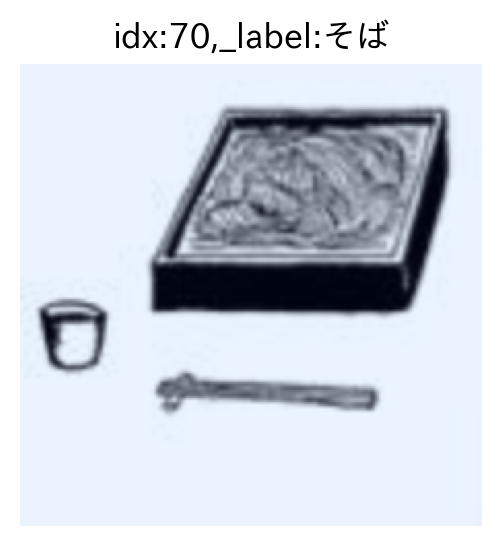

071 True 正解:お腹, 出力順位:0
072 True 正解:バター, 出力順位:1
073 True 正解:工場, 出力順位:0
074 True 正解:鳩, 出力順位:0
075 True 正解:電卓, 出力順位:0
076 True 正解:喉仏, 出力順位:0
077 True 正解:チューリップ, 出力順位:0
078 True 正解:白菜, 出力順位:2
079 True 正解:トラクター, 出力順位:0
080 True 正解:廊下, 出力順位:0
081 True 正解:パトカー, 出力順位:0
082 True 正解:押入れ, 出力順位:0
083 True 正解:鉛筆, 出力順位:0
084 True 正解:目尻, 出力順位:0
085 True 正解:芋, 出力順位:0
086 True 正解:吊り橋, 出力順位:0
087 True 正解:かき氷, 出力順位:1
088 True 正解:豹, 出力順位:0
089 True 正解:サボテン, 出力順位:0
090 True 正解:ピラミッド, 出力順位:0
091 True 正解:サイ, 出力順位:0
092 True 正解:目, 出力順位:0
093 True 正解:ひまわり, 出力順位:0
094 True 正解:はたき, 出力順位:0
095 True 正解:刺身, 出力順位:0
096 True 正解:玄関, 出力順位:0
097 True 正解:トマト, 出力順位:0
098 True 正解:三輪車, 出力順位:0
099 True 正解:鶏, 出力順位:0
100 False 正解:つむじ, 出力:['錨', '錨鎖', '引綱', '帆桁', '碇'], 順位:16881


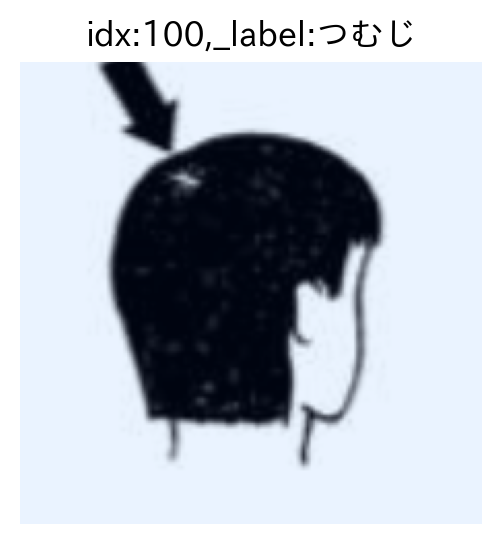

101 True 正解:アスパラガス, 出力順位:0
102 True 正解:ドア, 出力順位:0
103 True 正解:すりこ木, 出力順位:0
104 True 正解:ウイスキー, 出力順位:1
105 True 正解:梅, 出力順位:0
106 True 正解:タクシー, 出力順位:0
107 True 正解:動物園, 出力順位:0
108 True 正解:床の間, 出力順位:0
109 True 正解:ぶどう, 出力順位:0
110 True 正解:飴, 出力順位:0
111 True 正解:毛虫, 出力順位:0
112 True 正解:アイロン, 出力順位:0
113 True 正解:寺, 出力順位:0
114 True 正解:そり, 出力順位:0
115 True 正解:ひょうたん, 出力順位:1
116 True 正解:首, 出力順位:0
117 True 正解:消しゴム, 出力順位:0
118 True 正解:頬, 出力順位:0
119 True 正解:いちょう, 出力順位:0
120 True 正解:駅, 出力順位:0
121 True 正解:ギョウザ, 出力順位:0
122 True 正解:牛, 出力順位:0
123 True 正解:びわ, 出力順位:0
124 True 正解:飛行機, 出力順位:0
125 True 正解:畳, 出力順位:0
126 True 正解:竹, 出力順位:0
127 True 正解:ペリカン, 出力順位:0
128 True 正解:手すり, 出力順位:0
129 True 正解:口, 出力順位:0
130 True 正解:大根, 出力順位:0
131 True 正解:風車, 出力順位:0
132 True 正解:鋏, 出力順位:0
133 True 正解:潜水艦, 出力順位:0
134 True 正解:ステーキ, 出力順位:0
135 True 正解:マッチ, 出力順位:0
136 False 正解:二階, 出力:['もらい火', '玄関', '続き間', '帳台構え', '東屋旅館'], 順位:54


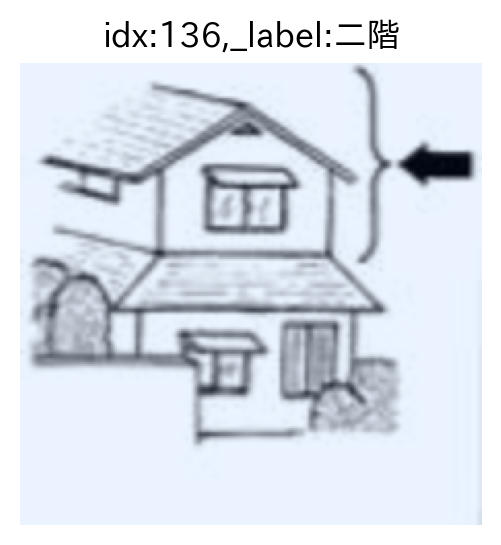

137 True 正解:落花生, 出力順位:0
138 True 正解:御飯, 出力順位:0
139 True 正解:自転車, 出力順位:0
140 True 正解:歩道橋, 出力順位:0
141 True 正解:鯨, 出力順位:0
142 True 正解:菖蒲, 出力順位:0
143 True 正解:ふくらはぎ, 出力順位:0
144 True 正解:桃, 出力順位:0
145 True 正解:たい焼き, 出力順位:0
146 True 正解:道路, 出力順位:0
147 True 正解:靴べら, 出力順位:0
148 True 正解:壁, 出力順位:0
149 True 正解:たんぽぽ, 出力順位:0
150 True 正解:いかだ, 出力順位:0
151 True 正解:山羊, 出力順位:0
152 True 正解:鼻, 出力順位:0
153 True 正解:海老, 出力順位:0
154 True 正解:台所, 出力順位:0
155 True 正解:オートバイ, 出力順位:0
156 True 正解:かぶ, 出力順位:0
157 True 正解:柳, 出力順位:0
158 True 正解:しゃもじ, 出力順位:0
159 True 正解:まんじゅう, 出力順位:0
160 True 正解:かかと, 出力順位:0
161 True 正解:家, 出力順位:0
162 True 正解:おせち料理, 出力順位:0
163 True 正解:傘, 出力順位:0
164 True 正解:つくし, 出力順位:19
165 True 正解:りんご, 出力順位:0
166 True 正解:馬車, 出力順位:0
167 True 正解:線路, 出力順位:0
168 True 正解:タツノオトシゴ, 出力順位:0
169 True 正解:耳, 出力順位:0
170 True 正解:便所, 出力順位:0
171 True 正解:蓮根, 出力順位:0
172 True 正解:猫, 出力順位:0
173 True 正解:へそ, 出力順位:0
174 True 正解:街灯, 出力順位:0
175 True 正解:障子, 出力順位:0
176 True 正解:酒, 出力順位:0
177 True 正解:船, 出力順位:0
178 True 正解:安全ピン, 出力順位:0
179 True 正解

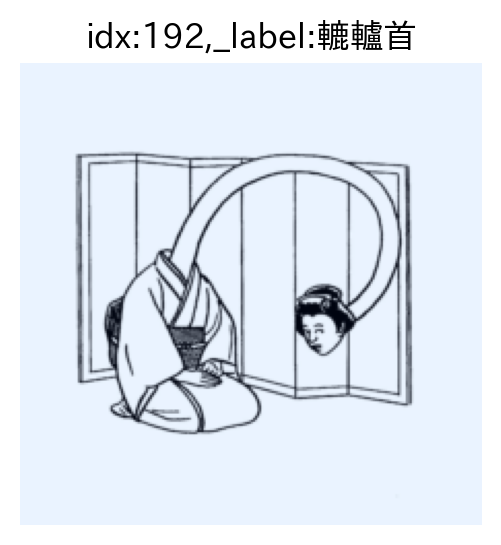

193 False 正解:毬藻, 出力:['稻葉', '芦高', '二水会', '御幡', '喜堂'], 順位:21510


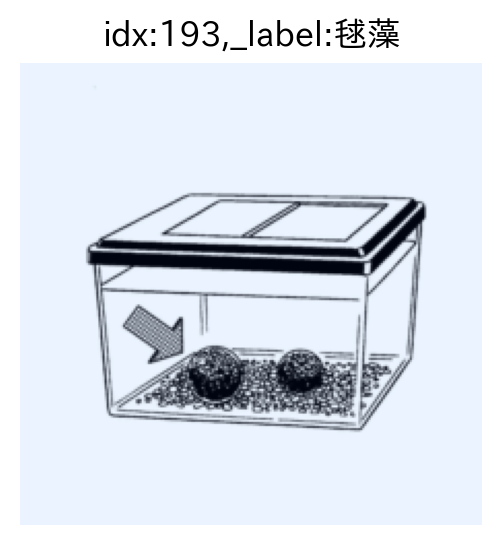

194 True 正解:タラップ, 出力順位:0
195 True 正解:野球, 出力順位:0
196 True 正解:電車, 出力順位:0
197 True 正解:雨, 出力順位:0
198 True 正解:鈴蘭, 出力順位:0
199 True 正解:糸, 出力順位:4
200 True 正解:桃, 出力順位:0
201 True 正解:自転車, 出力順位:0
202 True 正解:新幹線, 出力順位:0
203 True 正解:梯子, 出力順位:0
204 True 正解:寿司, 出力順位:0
205 True 正解:庇, 出力順位:0
206 True 正解:台所, 出力順位:0
207 True 正解:金槌, 出力順位:0
208 True 正解:兜, 出力順位:0
209 True 正解:お茶, 出力順位:0
210 True 正解:錨, 出力順位:0
211 True 正解:時計, 出力順位:0
212 True 正解:手, 出力順位:0
213 True 正解:医者, 出力順位:28
214 True 正解:すりこ木, 出力順位:2
215 True 正解:舞妓, 出力順位:0
216 True 正解:犬, 出力順位:0
217 True 正解:火の見櫓, 出力順位:0
218 True 正解:花束, 出力順位:0
219 True 正解:鞘, 出力順位:0
220 True 正解:暖簾, 出力順位:0
221 True 正解:鏡, 出力順位:0
222 True 正解:指輪, 出力順位:0
223 True 正解:池, 出力順位:0
224 True 正解:線路, 出力順位:0
225 True 正解:天井, 出力順位:0
226 True 正解:釣針, 出力順位:0
227 True 正解:ケーキ, 出力順位:0
228 True 正解:鼻緒, 出力順位:0
229 True 正解:吊橋, 出力順位:0
230 True 正解:茶托, 出力順位:0
231 True 正解:自動車, 出力順位:0
232 True 正解:菊人形, 出力順位:0
233 True 正解:蔦, 出力順位:0
234 True 正解:机, 出力順位:0
235 True 正解:果物, 出力順位:0
236 True 正解:灸, 出力順位:0
237 True 正解:門

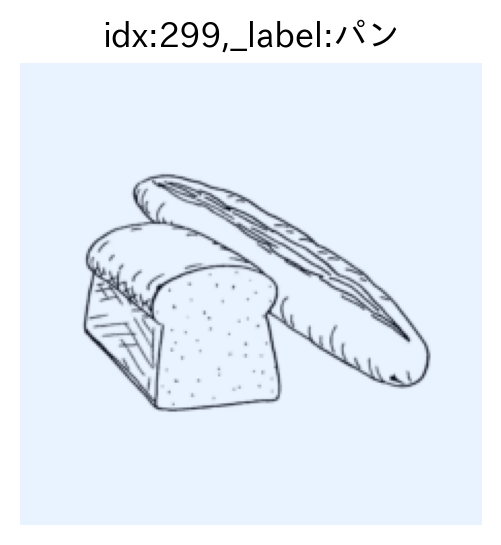

300 True 正解:切手, 出力順位:0
301 True 正解:テレビ, 出力順位:0
302 True 正解:指, 出力順位:0
303 True 正解:カーテン, 出力順位:0
304 True 正解:りんご, 出力順位:0
305 True 正解:目薬, 出力順位:0
306 True 正解:空, 出力順位:0
307 True 正解:こま, 出力順位:0
308 True 正解:おにぎり, 出力順位:0
309 True 正解:ポスト, 出力順位:1
310 True 正解:虹, 出力順位:0
311 True 正解:信号, 出力順位:13
312 True 正解:エプロン, 出力順位:0
313 True 正解:電話, 出力順位:0
314 True 正解:あご, 出力順位:0
315 True 正解:牛乳, 出力順位:0
316 True 正解:バス, 出力順位:0
317 True 正解:ねぎ, 出力順位:0
318 True 正解:アルバム, 出力順位:0
319 True 正解:はさみ, 出力順位:0
320 True 正解:じゃがいも, 出力順位:0
321 True 正解:バット, 出力順位:0
322 True 正解:いか, 出力順位:1
323 True 正解:滝, 出力順位:0
324 True 正解:病院, 出力順位:0
325 True 正解:ネクタイ, 出力順位:0
326 True 正解:デモ, 出力順位:0
327 True 正解:ろうそく, 出力順位:0
328 True 正解:口, 出力順位:0
329 True 正解:交番, 出力順位:0
330 True 正解:しゃもじ, 出力順位:0
331 True 正解:背中, 出力順位:0
332 True 正解:ハム, 出力順位:0
333 True 正解:いちご, 出力順位:0
334 True 正解:手紙, 出力順位:0
335 True 正解:ガム, 出力順位:0
336 True 正解:こけし, 出力順位:0
337 True 正解:アイロン, 出力順位:1
338 True 正解:へそ, 出力順位:1
339 True 正解:ペンギン, 出力順位:0
340 True 正解:火山, 出力順位:0
341 True 正解:朝顔, 出力順位:0
342 True 正

In [ ]:
# モデルを学習させる関数
def val_sem_model(net:torch.nn.Module=None,
                  ds=None,
                  w2v=w2v,
                  topn:int=20,
                  criterion=None,
                  verbose:bool=False):

    if criterion == None:
        criterion = nn.MSELoss()

    net.eval()   # モデルを検証モード
    _loss = 0.0  # epochの損失和
    _corrects = 0  # epochの正解数
    preds = []
    for idx in range(ds.__len__()):
        _inp, _emb, _tlpa_idx, _label, _ids, _w2v_ids = ds.__getitem__(idx)
        _out = net(_inp.unsqueeze(0))
        loss = criterion(_out, _emb)  # 損失を計算
        _loss += loss.item() * _inp.size(0)  # loss の合計を更新

        _out_vec = _out.detach().clone().numpy()[0]
        #_out_wrds = [l[0] for l in w2v.similar_by_vector(_out_vec, topn=topn)]
        _out_wrds = [l[0] for l in w2v.similar_by_vector(_out_vec, topn=40000)]
        yesno = _label in _out_wrds[:topn]

        if verbose:
            if yesno:
                #print(yesno, idx, _label, _out_wrds.index(_label))
                print(f'{idx:03d} {yesno} 正解:{_label}, 出力順位:{_out_wrds.index(_label)}')
            else:
                #print(yesno, idx, _label, _out_wrds)
                print(f'{idx:03d} {yesno} 正解:{_label}, 出力:{_out_wrds[:5]}, 順位:{_out_wrds.index(_label)}')
                #print(yesno, idx, _label, _out_wrds)
                plt.figure(figsize=(3,3))
                plt.title(f'idx:{idx},_label:{_label}')
                plt.axis(False)
                #plt.imshow(_inp.detach().clone().numpy().transpose(1,2,0))
                _img = _inp.detach().clone().numpy().transpose(1,2,0)
                _img_max, _img_min = _img.max(), _img.min()
                _img_range = (_img_max - _img_min)
                #print(f'_img_max:{_img_max:.3f}, _img_min:{_img_min:.3f}, _img_range:{_img_range:.3f}')
                _img = (_img - _img_min) / _img_range
                plt.imshow(_img)
                plt.show()
        if yesno:
            _corrects += 1
            pred_idx = _out_wrds.index(_label)
        else:
            pred_idx = -1

        preds.append((yesno, int(_tlpa_idx), _label, pred_idx))

    _acc = _corrects / ds.__len__()
    print(f'損失: {_loss:.3f}',
          f'精度: {_acc:.3f}', )
    if verbose:
        for pred in preds:
            if pred[0] == False:
                color = 'red'; attrs=['bold']
                print(colored(pred[1:], color=color, attrs=['bold']))
                #print(colored(pred[1:], color=color, attrs=['bold']), end=" ")
            #print()

#val_sem_model(V2S,ds=S_val_ds, verbose=False)
#val_sem_model(V2S,ds=S_val_ds, verbose=True)

val_sem_model(V2S,ds=S_val_ds, verbose=True, topn=40)

In [ ]:
#print(pre

In [ ]:
val_sem_model(V2S,ds=S_train_ds, verbose=True)

000 True 正解:バス, 出力順位:0
001 True 正解:桜, 出力順位:0
002 True 正解:のり巻き, 出力順位:3
003 True 正解:五重塔, 出力順位:0
004 True 正解:コップ, 出力順位:0
005 True 正解:ごぼう, 出力順位:0
006 True 正解:土踏まず, 出力順位:0
007 True 正解:風呂, 出力順位:0
008 True 正解:ヒトデ, 出力順位:0
009 True 正解:ハム, 出力順位:0
010 True 正解:兎, 出力順位:0
011 True 正解:ロープウエイ, 出力順位:0
012 True 正解:学校, 出力順位:0
013 True 正解:ちりとり, 出力順位:0
014 True 正解:縁側, 出力順位:0
015 True 正解:歯, 出力順位:0
016 True 正解:ネギ, 出力順位:0
017 True 正解:あじさい, 出力順位:0
018 True 正解:天井, 出力順位:0
019 True 正解:鍵, 出力順位:0
020 True 正解:ワニ, 出力順位:0
021 True 正解:電車, 出力順位:0
022 True 正解:顔, 出力順位:0
023 True 正解:松, 出力順位:0
024 True 正解:ガードレール, 出力順位:0
025 True 正解:柿, 出力順位:0
026 True 正解:ちまき, 出力順位:0
027 True 正解:信号, 出力順位:0
028 True 正解:すすき, 出力順位:0
029 True 正解:じょうろ, 出力順位:0
030 True 正解:コンセント, 出力順位:0
031 True 正解:天ぷら, 出力順位:0
032 True 正解:中指, 出力順位:0
033 True 正解:ヨット, 出力順位:0
034 True 正解:ふくろう, 出力順位:0
035 True 正解:みかん, 出力順位:0
036 True 正解:柱, 出力順位:0
037 True 正解:角砂糖, 出力順位:0
038 True 正解:犬, 出力順位:0
039 True 正解:かご, 出力順位:0
040 True 正解:バラ, 出力順位:0
041 True 正解:鍋, 出力順位:0
042 True 正解